# 🌿 AgriSense AI - Plant Disease Classification

This notebook develops a deep learning model for automatic plant disease classification using transfer learning with MobileNetV2.

The workflow includes:

- Dataset Loading
- Exploratory Data Analysis (EDA)
- Data Augmentation
- Data Preprocessing
- Transfer Learning
- Model Training
- Fine-Tuning
- Performance Evaluation
- Explainable AI (Grad-CAM)

In [1]:
import tensorflow as tf
import keras

print("TensorFlow:", tf.__version__)
print("Keras:", keras.__version__)

TensorFlow: 2.10.1
Keras: 2.10.0


In [2]:
import tensorflow as tf

print("TensorFlow Version:", tf.__version__)
print("Built with CUDA:", tf.test.is_built_with_cuda())
print("GPU Available:", tf.config.list_physical_devices('GPU'))

gpus = tf.config.list_physical_devices('GPU')

if gpus:
    print(f"\n✅ {len(gpus)} GPU(s) detected:")
    for gpu in gpus:
        print(" ", gpu)
else:
    print("\n❌ No GPU detected. TensorFlow will use CPU.")

TensorFlow Version: 2.10.1
Built with CUDA: True
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

✅ 1 GPU(s) detected:
  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [3]:
tf.debugging.set_log_device_placement(True)

a = tf.random.normal((1000, 1000))
b = tf.random.normal((1000, 1000))
c = tf.matmul(a, b)

print(c.shape)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomStandardNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomStandardNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op MatMul in device /job:localhost/replica:0/task:0/device:GPU:0
(1000, 1000)


## Import Libraries

In [5]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.applications import MobileNetV2

## Set Seed (Reproducibility)

In [6]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

## Dataset Paths

In [7]:
train_dir = r"Dataset/Plant Village Dataset/Train"
val_dir = r"Dataset/Plant Village Dataset/Val"
test_dir = r"Dataset/Plant Village Dataset/Test"

## Load Dataset

In [8]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 53693 files belonging to 29 classes.
Found 12067 files belonging to 29 classes.
Found 1358 files belonging to 29 classes.


## Checking classes

In [9]:
class_names = train_ds.class_names

print(f"Total Classes : {len(class_names)}")
print("\nClasses:\n")

for i, name in enumerate(class_names):
    print(f"{i+1}. {name}")

Total Classes : 29

Classes:

1. Apple - Apple Scab
2. Apple - Black Rot
3. Apple - Cedar Apple Rust
4. Apple - Healthy
5. Bell Pepper - Bacterial Spot
6. Bell Pepper - Healthy
7. Cherry - Healthy
8. Cherry - Powdery Mildew
9. Corn (Maize) - Cercospora Leaf Spot
10. Corn (Maize) - Common Rust
11. Corn (Maize) - Healthy
12. Corn (Maize) - Northern Leaf Blight
13. Grape - Black Rot
14. Grape - Esca (Black Measles)
15. Grape - Healthy
16. Grape - Leaf Blight
17. Peach - Bacterial Spot
18. Peach - Healthy
19. Potato - Early Blight
20. Potato - Healthy
21. Potato - Late Blight
22. Strawberry - Healthy
23. Strawberry - Leaf Scorch
24. Tomato - Bacterial Spot
25. Tomato - Early Blight
26. Tomato - Healthy
27. Tomato - Late Blight
28. Tomato - Septoria Leaf Spot
29. Tomato - Yellow Leaf Curl Virus


## Dataset Cardinality 

In [14]:
print("Training Batches   :", tf.data.experimental.cardinality(train_ds).numpy())
print("Validation Batches :", tf.data.experimental.cardinality(val_ds).numpy())
print("Testing Batches    :", tf.data.experimental.cardinality(test_ds).numpy())

Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Training Batches   : 1678
Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Validation Batches : 378
Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Testing Batches    : 43


## Number of Images

In [15]:
train_images = tf.data.experimental.cardinality(train_ds).numpy() * BATCH_SIZE
val_images = tf.data.experimental.cardinality(val_ds).numpy() * BATCH_SIZE
test_images = tf.data.experimental.cardinality(test_ds).numpy() * BATCH_SIZE

print("Approx Training Images :", train_images)
print("Approx Validation Images :", val_images)
print("Approx Testing Images :", test_images)

Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Approx Training Images : 53696
Approx Validation Images : 12096
Approx Testing Images : 1376


Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TakeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice 

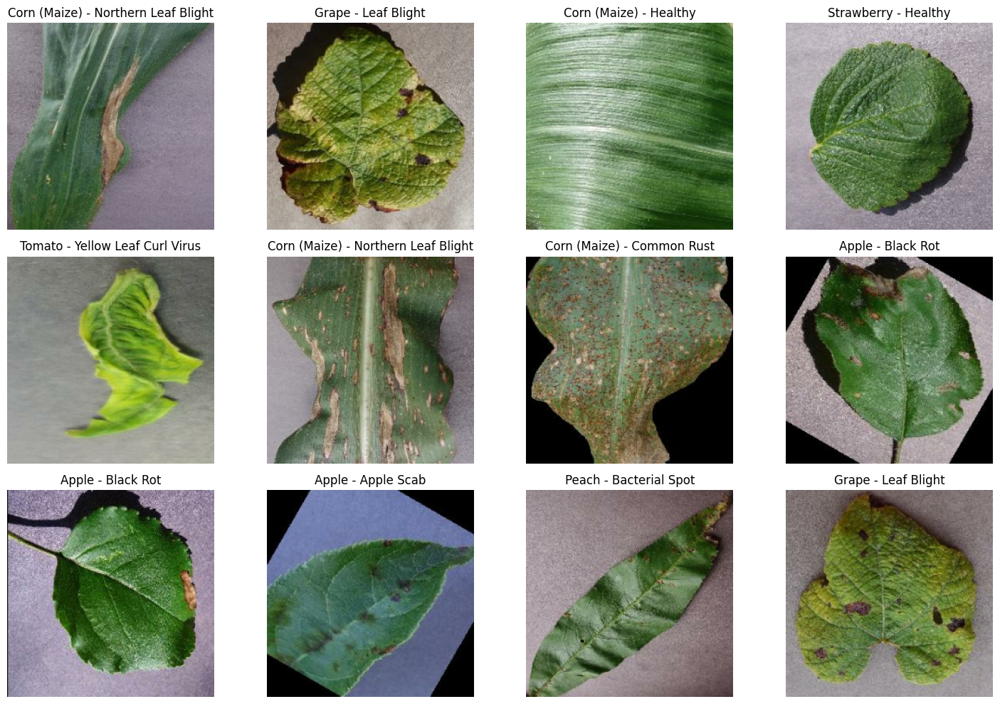

In [16]:
plt.figure(figsize=(15,10))

for images, labels in train_ds.take(1):

    for i in range(12):

        ax = plt.subplot(3,4,i+1)

        plt.imshow(images[i].numpy().astype("uint8"))

        plt.title(class_names[labels[i]])

        plt.axis("off")

plt.tight_layout()
plt.show()

## Checking Image Shape 

In [17]:
for images, labels in train_ds.take(1):

    print("Image Batch Shape :", images.shape)
    print("Label Batch Shape :", labels.shape)

Executing op TakeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Image Batch Shape : (32, 224, 224, 3)
Label Batch Shape : (32,)
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0


In [18]:
print(images.dtype)

<dtype: 'float32'>


In [19]:
print(tf.reduce_min(images).numpy())
print(tf.reduce_max(images).numpy())

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Min in device /job:localhost/replica:0/task:0/device:GPU:0
0.0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Max in device /job:localhost/replica:0/task:0/device:GPU:0
255.0


## Class Distribution 

In [20]:
import os

print("Training Dataset:\n")

for class_name in sorted(os.listdir(train_dir)):
    class_path = os.path.join(train_dir, class_name)

    if os.path.isdir(class_path):
        print(f"{class_name:<40} {len(os.listdir(class_path))}")

Training Dataset:

Apple - Apple Scab                       2016
Apple - Black Rot                        1987
Apple - Cedar Apple Rust                 1760
Apple - Healthy                          2008
Bell Pepper - Bacterial Spot             1913
Bell Pepper - Healthy                    1988
Cherry - Healthy                         1826
Cherry - Powdery Mildew                  1683
Corn (Maize) - Cercospora Leaf Spot      1642
Corn (Maize) - Common Rust               1907
Corn (Maize) - Healthy                   1859
Corn (Maize) - Northern Leaf Blight      1908
Grape - Black Rot                        1888
Grape - Esca (Black Measles)             1920
Grape - Healthy                          1692
Grape - Leaf Blight                      1722
Peach - Bacterial Spot                   1838
Peach - Healthy                          1728
Potato - Early Blight                    1939
Potato - Healthy                         1824
Potato - Late Blight                     1939
Strawberry - He

##  Data Augmentation

Data augmentation is applied to artificially increase the diversity of the training data. It helps improve model generalization and reduces overfitting by exposing the network to slightly modified versions of the same images.

In [21]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.10),
    layers.RandomZoom(0.15),
    layers.RandomContrast(0.10),
], name="data_augmentation")

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op TakeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ExpandDims in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device

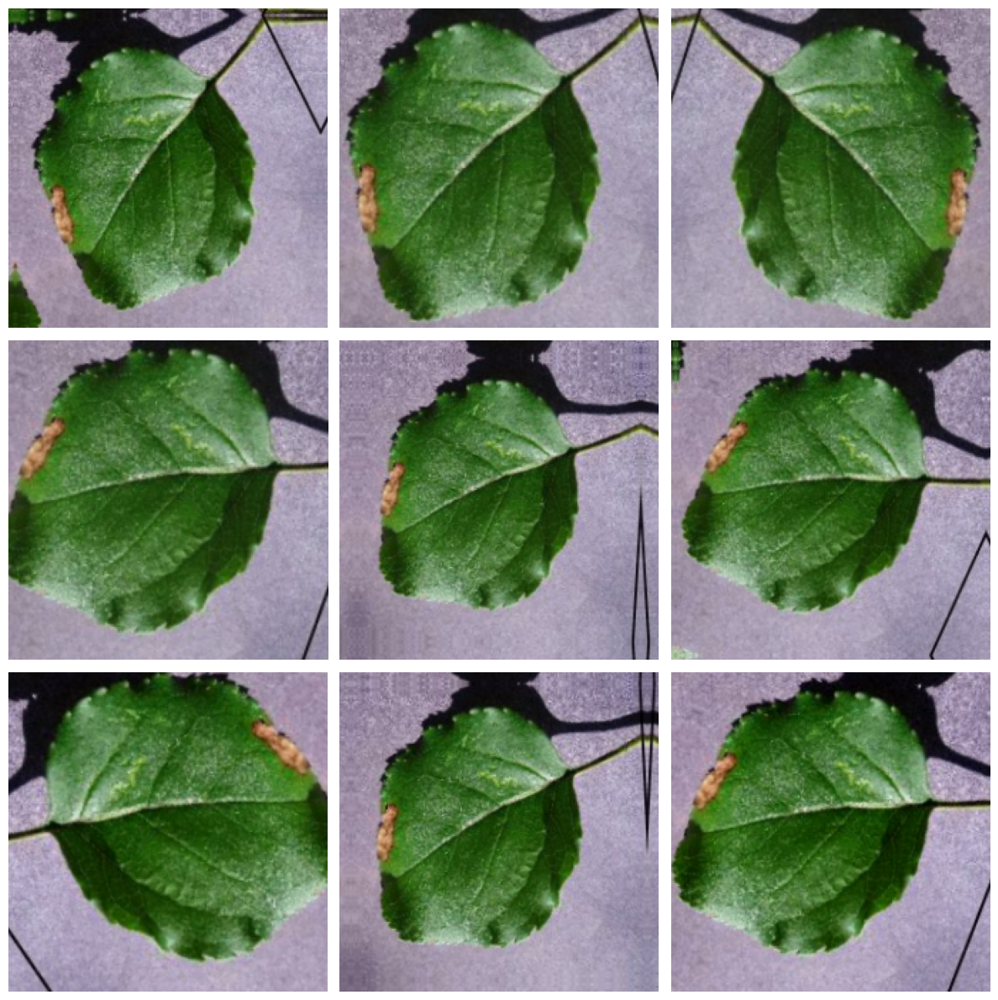

In [22]:
plt.figure(figsize=(12,12))

for images, labels in train_ds.take(1):

    first_image = images[0]

    for i in range(9):

        ax = plt.subplot(3,3,i+1)

        augmented = data_augmentation(
            tf.expand_dims(first_image, axis=0),
            training=True
        )

        plt.imshow(augmented[0].numpy().astype("uint8"))

        plt.axis("off")

plt.tight_layout()

plt.show()

## Data Preprocessing

Before training, images are preprocessed using MobileNetV2's preprocessing function.

The preprocessing step converts pixel values from the range **0–255** to the range expected by the pretrained MobileNetV2 network.

In [23]:
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

## data Optimization 

In [24]:
AUTOTUNE = tf.data.AUTOTUNE


In [25]:
train_ds = train_ds.cache().prefetch(AUTOTUNE)

val_ds = val_ds.cache().prefetch(AUTOTUNE)

test_ds = test_ds.cache().prefetch(AUTOTUNE)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DummyMemoryCache in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CacheDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DummyMemoryCache in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CacheDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DummyMemoryCache in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CacheDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0


## Build MobileNetV2 Model

Transfer learning is used to leverage knowledge learned from the ImageNet dataset.

The pretrained MobileNetV2 model acts as a feature extractor, while custom classification layers are added to classify plant diseases.

Initially, the pretrained layers are frozen to preserve the learned feature representations.

### Import Preprocessing

In [26]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.layers import (
    Input,
    Dense,
    Dropout,
    GlobalAveragePooling2D
)
from tensorflow.keras.models import Model

### Load MobileNetV2

In [27]:
base_model = MobileNetV2(
    weights="imagenet",
    include_top=False,
    input_shape=(224,224,3)
)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in d

### Freeze Base Model

In [28]:
base_model.trainable = False

### Build Complete Model

In [29]:
inputs = Input(shape=(224,224,3))

# Data Augmentation
x = data_augmentation(inputs)

# MobileNetV2 Preprocessing
x = preprocess_input(x)

# Feature Extraction
x = base_model(x, training=False)

# Convert Feature Maps → Feature Vector
x = GlobalAveragePooling2D()(x)

# Regularization
x = Dropout(0.3)(x)

# Fully Connected Layer
x = Dense(256, activation="relu")(x)

# Regularization
x = Dropout(0.3)(x)

# Output Layer
outputs = Dense(len(class_names), activation="softmax")(x)

model = Model(inputs, outputs)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device

In [30]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, 224, 224, 3)      0         
 al)                                                             
                                                                 
 tf.math.truediv (TFOpLambda  (None, 224, 224, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                      

#  Model Compilation

The model is compiled before training by defining the optimizer, loss function, and evaluation metric.

- **Adam Optimizer** is chosen because it provides fast and stable convergence during training.
- **Sparse Categorical Crossentropy** is used since the dataset labels are integer-encoded.
- **Accuracy** is used to measure the model's classification performance.

In [31]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0


In [32]:
print("Model compiled successfully!")

Model compiled successfully!


#  Define Training Callbacks

Callbacks improve the training process by automatically monitoring model performance.

The following callbacks are used:

- **EarlyStopping:** Stops training if validation loss does not improve.
- **ModelCheckpoint:** Saves the best-performing model.
- **ReduceLROnPlateau:** Reduces the learning rate when validation performance stops improving.

In [33]:
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ModelCheckpoint,
    ReduceLROnPlateau,
    CSVLogger
)

callbacks = [

    EarlyStopping(
        monitor="val_loss",
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),

    ModelCheckpoint(
        "best_mobilenetv2.keras",
        monitor="val_accuracy",
        save_best_only=True,
        verbose=1
    ),

    ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.2,
        patience=3,
        min_lr=1e-6,
        verbose=1
    ),

    CSVLogger("training_log.csv")

]

# Train the Model

The model is trained using the augmented training dataset while monitoring its performance on the validation dataset.

The best-performing model is automatically saved during training using the defined callbacks.

In [ ]:
EPOCHS = 20

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=callbacks
)
print("Model Training Completed Successfully!")

Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GreaterEqual in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity i

# 🌿 Model Evaluation

In this section, the best saved MobileNetV2 model is evaluated on the unseen test dataset to measure its generalization performance.

### Evaluation Metrics
- Test Accuracy
- Test Loss
- Classification Report
- Confusion Matrix

The model used for evaluation is the best checkpoint saved during training:
`best_mobilenetv2.keras`

In [36]:
from tensorflow.keras.models import load_model

model = load_model("best_mobilenetv2.keras")
print("✅ Model Loaded")

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Reshape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /

In [37]:
test_loss, test_accuracy = model.evaluate(test_ds, verbose=1)

Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GreaterEqual in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity i

In [ ]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    initial_epoch=8,
    epochs=15,
    callbacks=callbacks
)

Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GreaterEqual in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity i

# Model Evaluation 2.0

The trained MobileNetV2 model is evaluated on the unseen test dataset to measure its generalization performance.

Evaluation metrics:
- Test Accuracy
- Test Loss

The best saved model (best_mobilenetv2.keras) is loaded before evaluation to ensure the highest-performing weights are used.

In [39]:
from tensorflow.keras.models import load_model

best_model = load_model("best_mobilenetv2.keras")

test_loss, test_accuracy = best_model.evaluate(test_ds)

print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print(f"Test Loss: {test_loss:.4f}")

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Reshape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /

# Classification Report

A Classification Report is generated to evaluate the model's performance for every disease class.

It provides:

- Precision
- Recall
- F1-Score
- Support

This helps identify classes where the model performs well and classes that may require further improvement.

In [40]:
from sklearn.metrics import classification_report
import numpy as np

y_true = np.concatenate([y for x, y in test_ds], axis=0)

y_pred_probs = best_model.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)

print(classification_report(
    y_true,
    y_pred,
    target_names=class_names
))

Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/devi

# Confusion Matrix

A confusion matrix is generated to visualize the classification performance of the model.

It helps identify:

- Correct predictions
- Misclassified disease classes
- Similar disease categories

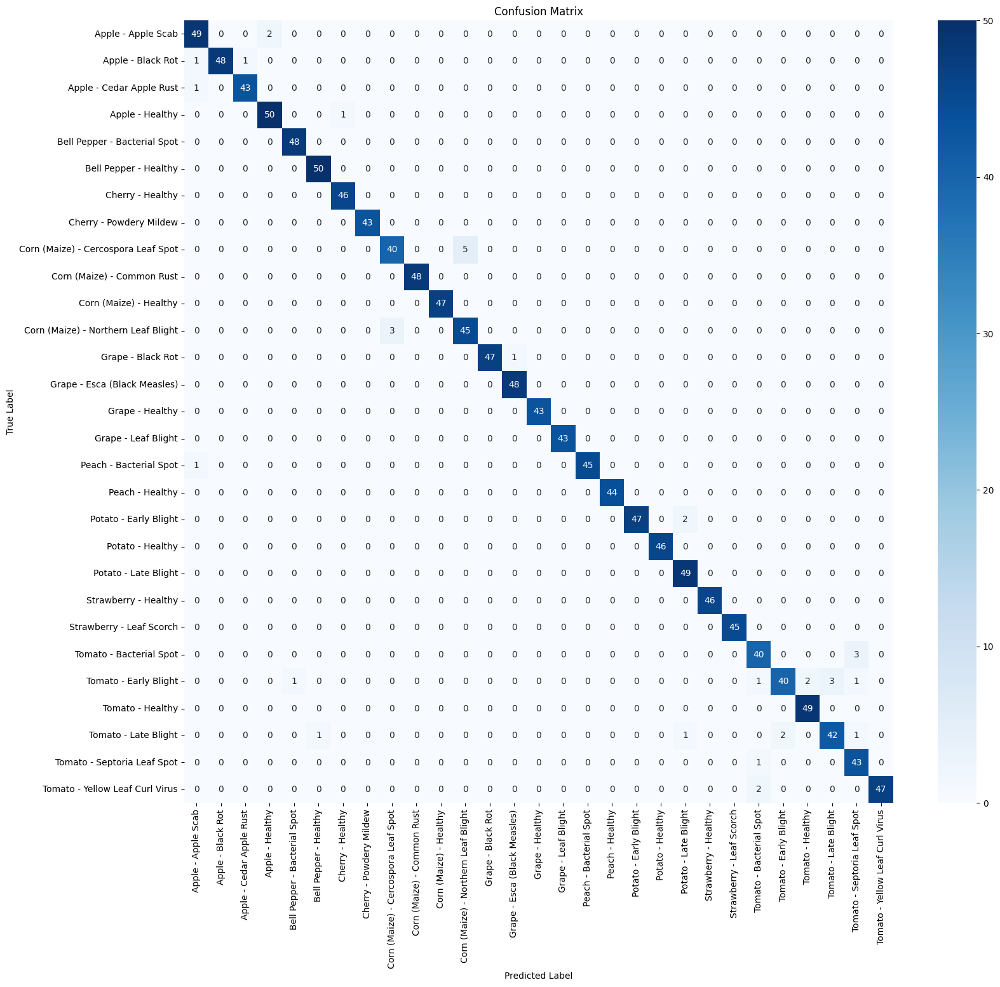

In [43]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(18,16))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")

plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.show()

# Confusion Matrix Analysis

A confusion matrix is used to evaluate the classification performance of the trained MobileNetV2 model across all plant disease classes.

The matrix compares the actual class labels with the predicted class labels for each test sample.

### Purpose
- Visualize correct and incorrect predictions.
- Identify disease classes that are frequently misclassified.
- Analyze similarities between visually similar plant diseases.
- Evaluate the overall robustness of the model.

### Observation

The confusion matrix shows a strong diagonal pattern, indicating that the majority of test samples were correctly classified. Only a small number of misclassifications were observed, mainly among visually similar disease categories such as tomato and maize diseases.

The results demonstrate that the proposed model has excellent classification capability and strong generalization performance across **11 plant species** and **29 disease classes**.

# Model Performance Summary

The proposed MobileNetV2-based plant disease detection model achieved excellent performance on the PlantVillage dataset.

## Final Results

| Metric | Value |
|---------|------:|
| Plant Species | 11 |
| Disease Classes | 29 |
| Best Validation Accuracy | **96.24%** |
| Test Accuracy | **97.28%** |
| Test Loss | **0.0796** |
| Precision | **97%** |
| Recall | **97%** |
| F1-Score | **97%** |

## Conclusion

The trained model demonstrates excellent generalization capability and accurately classifies plant diseases across multiple crop species. With a test accuracy of **97.28%**, the proposed system can serve as the core disease detection engine for the AgriSense AI platform. Future enhancements will include treatment recommendations, fertilizer suggestions, weather-based disease alerts, and an AI-powered agricultural assistant to provide complete support for farmers.

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Reshape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /

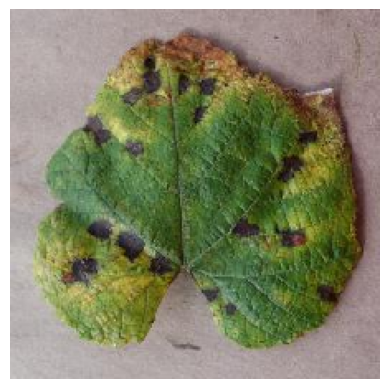

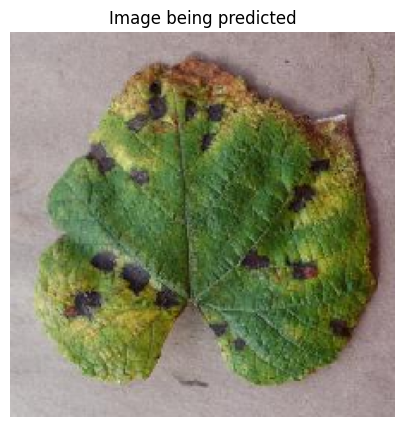

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

In [53]:
import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# Load Best Model
model = load_model("best_mobilenetv2.keras")

# Image Path
img_path = "grpae.JPG"      # <-- Replace with your image name

# Load Image
img = image.load_img(img_path, target_size=(224,224))

# Display Image
plt.imshow(img)
plt.axis("off")
plt.show()

# Convert to Array
img_array = image.img_to_array(img)

# Expand Dimensions
img_array = np.expand_dims(img_array, axis=0)

# Preprocess
img_array = preprocess_input(img_array)
plt.figure(figsize=(5,5))
plt.imshow(img)
plt.axis("off")
plt.title("Image being predicted")
plt.show()

# Prediction
prediction = model.predict(img_array)

predicted_index = np.argmax(prediction)

predicted_class = class_names[predicted_index]

confidence = np.max(prediction) * 100

print("="*60)
print("Predicted Disease :", predicted_class)
print(f"Confidence Score : {confidence:.2f}%")
print("="*60)

In [47]:
prediction = model.predict(img_array)

top5 = np.argsort(prediction[0])[::-1][:5]

for i in top5:
    print(class_names[i], prediction[0][i])

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

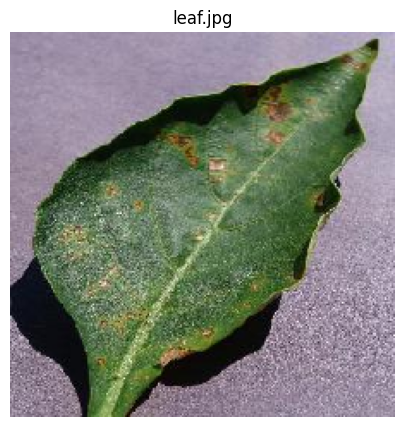

In [48]:
img_path = "leaf.jpg"

img = image.load_img(img_path, target_size=(224,224))

plt.figure(figsize=(5,5))
plt.imshow(img)
plt.title(img_path)
plt.axis("off")
plt.show()

In [51]:
print(len(class_names))
print(class_names)

29
['Apple - Apple Scab', 'Apple - Black Rot', 'Apple - Cedar Apple Rust', 'Apple - Healthy', 'Bell Pepper - Bacterial Spot', 'Bell Pepper - Healthy', 'Cherry - Healthy', 'Cherry - Powdery Mildew', 'Corn (Maize) - Cercospora Leaf Spot', 'Corn (Maize) - Common Rust', 'Corn (Maize) - Healthy', 'Corn (Maize) - Northern Leaf Blight', 'Grape - Black Rot', 'Grape - Esca (Black Measles)', 'Grape - Healthy', 'Grape - Leaf Blight', 'Peach - Bacterial Spot', 'Peach - Healthy', 'Potato - Early Blight', 'Potato - Healthy', 'Potato - Late Blight', 'Strawberry - Healthy', 'Strawberry - Leaf Scorch', 'Tomato - Bacterial Spot', 'Tomato - Early Blight', 'Tomato - Healthy', 'Tomato - Late Blight', 'Tomato - Septoria Leaf Spot', 'Tomato - Yellow Leaf Curl Virus']


In [54]:
print(model.output_shape)
print(prediction.shape)
print(np.sum(prediction))

(None, 29)
(1, 29)
1.0


In [55]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, 224, 224, 3)      0         
 al)                                                             
                                                                 
 tf.math.truediv (TFOpLambda  (None, 224, 224, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                      

Executing op TakeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0


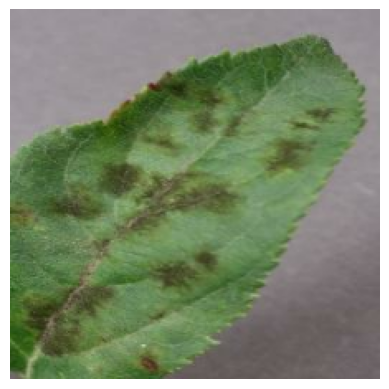

Executing op ExpandDims in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op R

In [56]:
for images, labels in test_ds.take(1):
    img = images[0]
    true_label = class_names[labels[0]]

    plt.imshow(img.numpy().astype("uint8"))
    plt.axis("off")
    plt.show()

    pred = model.predict(tf.expand_dims(img, axis=0), verbose=0)
    pred_label = class_names[np.argmax(pred)]

    print("True Label :", true_label)
    print("Pred Label :", pred_label)

Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ExpandDims in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset 

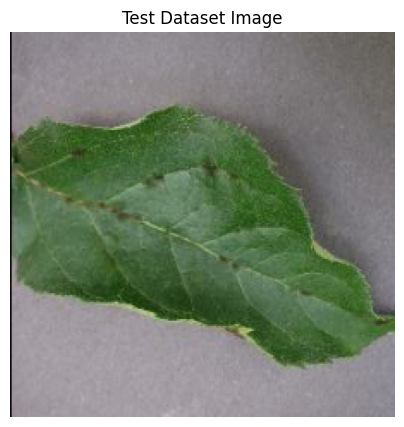

True Label      : Apple - Apple Scab
Predicted Label : Apple - Apple Scab
Confidence      : 99.99%


In [57]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Take one batch from test dataset
images, labels = next(iter(test_ds))

# Select a random image
idx = np.random.randint(0, len(images))

img = images[idx]
true_label = class_names[labels[idx]]

# Predict
prediction = model.predict(tf.expand_dims(img, axis=0), verbose=0)

pred_idx = np.argmax(prediction)
pred_label = class_names[pred_idx]
confidence = prediction[0][pred_idx] * 100

# Display image
plt.figure(figsize=(5,5))
plt.imshow(img.numpy().astype("uint8"))
plt.axis("off")
plt.title("Test Dataset Image")
plt.show()

print("="*60)
print("True Label      :", true_label)
print("Predicted Label :", pred_label)
print(f"Confidence      : {confidence:.2f}%")
print("="*60)

In [58]:
print(img_array.min(), img_array.max())

-1.0 0.8666667


In [59]:
images, labels = next(iter(test_ds))
sample = images[0].numpy()

print(sample.min(), sample.max())

Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
0.48979652 215.14267


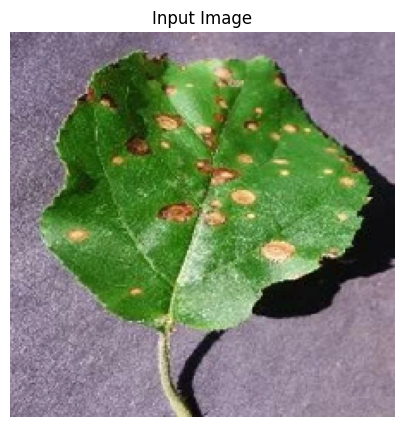

Predicted Disease : Apple - Black Rot
Confidence Score  : 100.00%

Top 5 Predictions

Apple - Black Rot                        100.00%
Apple - Cedar Apple Rust                 0.00%
Apple - Apple Scab                       0.00%
Bell Pepper - Bacterial Spot             0.00%
Peach - Bacterial Spot                   0.00%


In [15]:
import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model

# Load Best Model
model = load_model("best_mobilenetv2.keras")

# Image Path
img_path = "apple.jpg"

# Load Image
img = image.load_img(img_path, target_size=(224, 224))

# Display Image
plt.figure(figsize=(5,5))
plt.imshow(img)
plt.axis("off")
plt.title("Input Image")
plt.show()

# Convert Image to Array
img_array = image.img_to_array(img)

# Expand Dimensions
img_array = np.expand_dims(img_array, axis=0)

# ❌ DO NOT use preprocess_input() here
# img_array = preprocess_input(img_array)

# Prediction
prediction = model.predict(img_array, verbose=0)
img.save("debug_notebook.jpg")

predicted_index = np.argmax(prediction)
predicted_class = class_names[predicted_index]
confidence = prediction[0][predicted_index] * 100

print("="*60)
print("Predicted Disease :", predicted_class)
print(f"Confidence Score  : {confidence:.2f}%")
print("="*60)

# Top 5 Predictions
print("\nTop 5 Predictions\n")

top5 = np.argsort(prediction[0])[::-1][:5]

for idx in top5:
    print(f"{class_names[idx]:40s} {prediction[0][idx]*100:.2f}%")

In [16]:
import tensorflow as tf
print(tf.__version__)

2.10.1
